In [1]:
%%javascript
require(['base/js/utils'],
function(utils) {
   utils.load_extensions('calico-spell-check', 'calico-document-tools', 'calico-cell-tools');
});

<IPython.core.display.Javascript object>

# Predict The Standings Of 18/19 Premiere League Base On Previous Data
---
## Abstract
In this project, a process of scrapping the data of premier league from 2005 to 2017 on https://www.transfermarkt.com/ is presented. The scrapped data are organised into a big DataFrame follow a clear naming convention. During the EDA, a correlation table and a multivariate plot demonstrate the potential correlation. A couple of machine learning techniques have performed on the data, trying to find the most reliable prediction. At meanwhile, the evaluation for each techniques are presented after prediction. Linear regression method under-fit the problem while non-linear regression methods have a high variance. **K Nearest Neighbours** 

## Introduction
The Premier League is an exciting English football league system. Nowadays, it is the most valuable football league system among the world, which 20 different clubs furiously fight each other for the champion and a ticket to the UEFA Champions league. The champion of the premier league is much unpredictable than other same level leagues due to the big investment to different clubs in the league.

The interest of predicting the standings for each clubs at the beginning of the season never stops. Not only the huge enthusiasm from the fans but also all the betting companies are focusing on this area. A successfully prediction can bring a big profits. However, this project is completely non-profit and any usage of the result of this project should be at your own risk. This project presents the process of scrapping resource from website and using regression and KNN to predict the standings base on the market values of a club.

In [1]:
# imports
import requests
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
import seaborn as sns
from pylab import rcParams

sns.set(style="ticks")
sns.set_style("whitegrid")
rcParams['figure.dpi'] = 350
rcParams['lines.linewidth'] = 2
rcParams['axes.facecolor'] = 'white'
rcParams['patch.edgecolor'] = 'white'
rcParams['font.family'] = 'StixGeneral'
rcParams['font.size'] = 20
rcParams['figure.figsize'] = (10,10)
rcParams['axes.labelsize'] = 'large'
rcParams['xtick.labelsize'] = 20
rcParams['ytick.labelsize'] = 20

## Scrap The Web Page
---
In order to increase the readability of this notebook, the web scrapping process is written in the `web_scrapper` class and imported to this notebook. It scraps the summary and standings tables from https://www.transfermarkt.com/premier-league/startseite/wettbewerb/GB1/plus/?saison_id=2017 in the range between 2005 to 2017 and convert merge it to a giant dictionary with the year as the key and the summary detail of premier league in that year as the value.

In [3]:
from web_scrapper import web_scrapper

In [4]:
my_web_scrapper = web_scrapper()
try:
    my_web_scrapper.connect()
except requests.ConnectionError as detail:
    print(detail)

Request Succeeded!


In [5]:
summary_dfs = my_web_scrapper.digest()

In [6]:
summary_dfs[2005].head(3)

,Avg. Market Values,Avg. Player age,Club Full Name,Club Short Name,Total Market Values,Position,Goal Difference,Points
0,"13,04 Mill. €","24,5",Chelsea FC,Chelsea,"352,18 Mill. €",1,50,91
1,"9,89 Mill. €","24,9",Manchester United,Man Utd,"286,93 Mill. €",2,38,83
2,"6,63 Mill. €","23,3",Arsenal FC,Arsenal,"218,95 Mill. €",4,37,67


## Scrap The Web API
---
If the website has an available API will make your live much easier than you scrapping from the raw HTML. Since the website we primary look into doesn't have an API, we found a website https://www.apify.com/ which can crawl https://www.transfermarkt.com/ and generate a json format API.

**_Note: Since I didn't subscribe a membership on that website their API link might become invalid when my free account expired_**

In [7]:
import json

In [8]:
url = "https://api.apify.com/v1/SyD5kRQyDutSTR8LD/crawlers/ibPK3eJzvSBQis4fP/lastExec/results?token=zedtBuCoYTJfpgMrx5BQmErPm"
response = requests.get(url)
if response.status_code != 200:
    print("Oops, cannot connect to the API, check if the membership of that website expired")

In [9]:
response_json = response.content
players_18_dict = json.loads(response.content)

Organise the json format and store it into a DataFrame

In [10]:
players_18_df = pd.DataFrame()
for record in players_18_dict:
    players_18_df = players_18_df.append(record["pageFunctionResult"], ignore_index=True)

In [11]:
players_18_df.columns

Index([u'Age', u'Contract until', u'Current club', u'Date of Birth',
       u'Date of last contract extension', u'Facebook', u'Foot', u'Full Name',
       u'Height', u'Instagram', u'Joined', u'Name', u'Nationality', u'Photo',
       u'Place of Birth', u'Player agents', u'Position', u'Twitter',
       u'currentMarketValue', u'jerseyNumber',
       u'Name in Home Country /\nFull Name', u'Outfitter', u'Website',
       u'Google+', u'Contract option', u'2nd club', u'Shoe model',
       u'Contract there until', u'Loan club', u'Twitter-Hashtag',
       u'Shoe size'],
      dtype='object')

## Prepare The Data
---
As we see above in the table, the data scrapped from https://www.transfermarkt.com are in good shape. However, we have to clean this data for machine learning's sake since model will only accept numeric inputs.

In [12]:
big_summary_df = pd.DataFrame()
for key, df in summary_dfs.items():
    df["Year"] = key
    big_summary_df = pd.concat((big_summary_df, df))

In [13]:
big_summary_df.reset_index(drop=True, inplace=True)
big_summary_df.tail(3)

,Avg. Market Values,Avg. Player age,Club Full Name,Club Short Name,Total Market Values,Position,Goal Difference,Points,Year
277,"2,53 Mill. €","25,6",Norwich City,Norwich,"103,75 Mill. €",19,-28,34,2015
278,"2,61 Mill. €","25,9",Leicester City,Leicester,"91,25 Mill. €",1,32,81,2015
279,"1,39 Mill. €","24,1",AFC Bournemouth,Bournemouth,"68,03 Mill. €",16,-22,42,2015


For the sake of readability, we can use a helper class which helps us to move the unit of both "Avg. Market Values" and "Total Market Values" to the column names. Then it can change all the cells that are numeric values to a proper data type.

In [14]:
from df_cleaner import df_cleaner

The `df_cleaner` class will perform the data integrity checking as well. Especially in `Avg. Market Values` and `Total Market Values` columns, there are rows that use different units, for example billion and thousand which needs to be converted to million.

In [15]:
my_df_cleaner = df_cleaner()
numeric_big_summary_df = my_df_cleaner.cook(big_summary_df)
numeric_big_summary_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 280 entries, 0 to 279
Data columns (total 9 columns):
Avg. Market Values(Mill. €)     280 non-null float64
Avg. Player age                 280 non-null float64
Club Full Name                  280 non-null object
Club Short Name                 280 non-null object
Total Market Values(Mill. €)    280 non-null float64
Position                        280 non-null int64
Goal Difference                 280 non-null int64
Points                          280 non-null int64
Year                            280 non-null int64
dtypes: float64(3), int64(4), object(2)
memory usage: 19.8+ KB


In [16]:
numeric_big_summary_df.head(3)

,Avg. Market Values(Mill. €),Avg. Player age,Club Full Name,Club Short Name,Total Market Values(Mill. €),Position,Goal Difference,Points,Year
0,14.12,24.7,Manchester City,Man City,621.40,3,41,78,2016
1,12.31,23.8,Chelsea FC,Chelsea,603.30,1,52,93,2016
2,12.70,23.5,Manchester United,Man Utd,533.25,6,25,69,2016


## EDA
---
Before we feed the data to the model, it is important that we can analyse the data both visually and numerically first. It will give us more intuition of the problem we are trying to solve.

In [17]:
def color_strong_corr_red(val):
    """
    Takes a scalar and returns a string with
    the css property `'color: red'` for strong correlations
    , black otherwise.
    """
    color = 'red' if (val > 0.6 or val < -0.6)  else 'black'
    return 'color: %s' % color

As the correlation table will be most intuitive, we can take a look which two numeric features have a strong correlation.

In [18]:
numeric_big_summary_df.corr().style.applymap(color_strong_corr_red)

,Avg. Market Values(Mill. €),Avg. Player age,Total Market Values(Mill. €),Position,Goal Difference,Points,Year
Avg. Market Values(Mill. €),1,-0.00948144,0.960569,-0.559316,0.558021,0.158199,0.37272
Avg. Player age,-0.00948144,1,-0.145768,0.293007,-0.309163,-0.497048,0.17815
Total Market Values(Mill. €),0.960569,-0.145768,1,-0.61135,0.617925,0.286451,0.402785
Position,-0.559316,0.293007,-0.61135,1,-0.900655,-0.736599,0
Goal Difference,0.558021,-0.309163,0.617925,-0.900655,1,0.769066,0
Points,0.158199,-0.497048,0.286451,-0.736599,0.769066,1,-0.271716
Year,0.37272,0.17815,0.402785,0,0,-0.271716,1


We can see that total market values of a club has a relationship with both position and goal difference. Let's visualise this relationship.

In [19]:
g = sns.PairGrid(numeric_big_summary_df[numeric_big_summary_df["Year"]!=2018].iloc[:, :-1], height=5)
g = g.map_upper(plt.scatter)
g = g.map_lower(sns.kdeplot)
g = g.map_diag(sns.kdeplot)

From the histogram of each feature we can tell that `average market values` might have a good potential to be a good predictor for `goal difference`, `points` and `position`. `Total market values` has the same property, while the histogram of total market values is less intuitive in grid plots. 

## Data Transform
---
It might worths the efforts to make the average market values more normal distributed to make regression stage efficient.

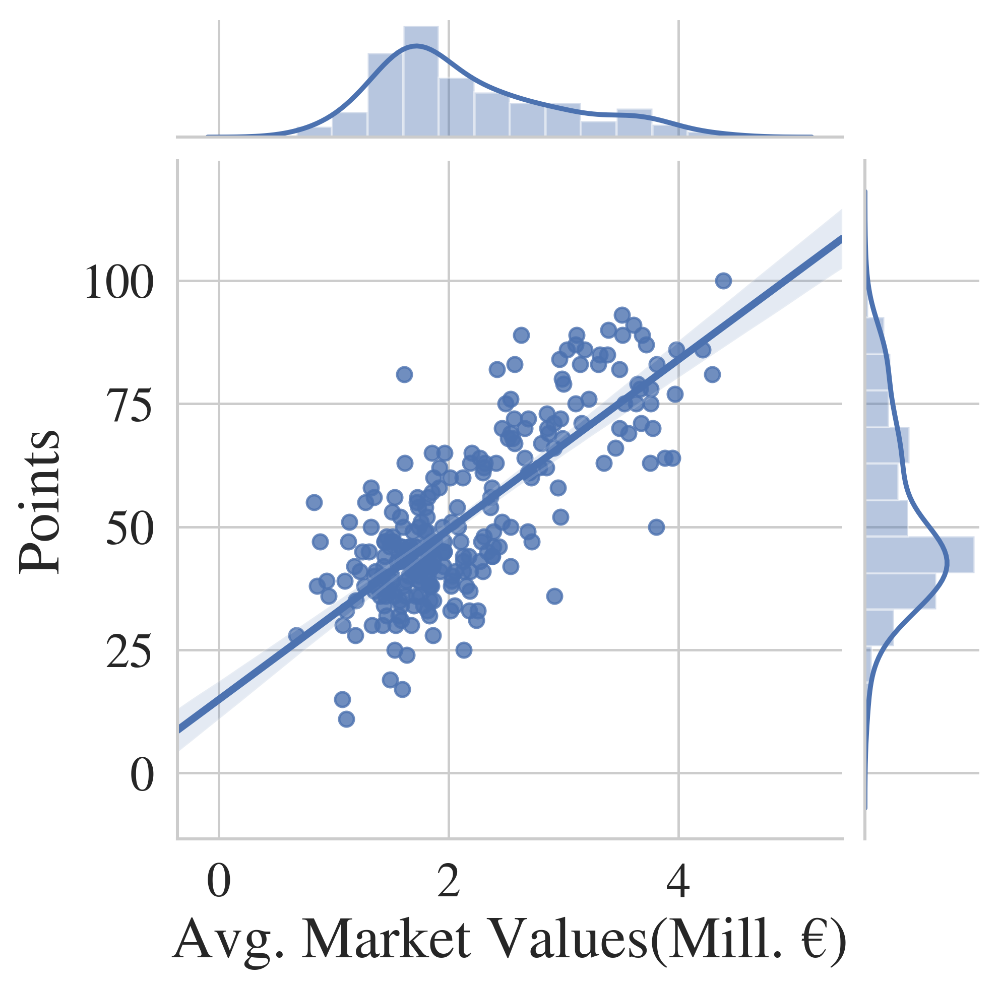

In [20]:
sns.jointplot(
    x=np.sqrt(numeric_big_summary_df[numeric_big_summary_df["Year"]!=2018].iloc[:, 0] ),
    y=numeric_big_summary_df[numeric_big_summary_df["Year"]!=2018].iloc[:, -2], kind="reg",
             )

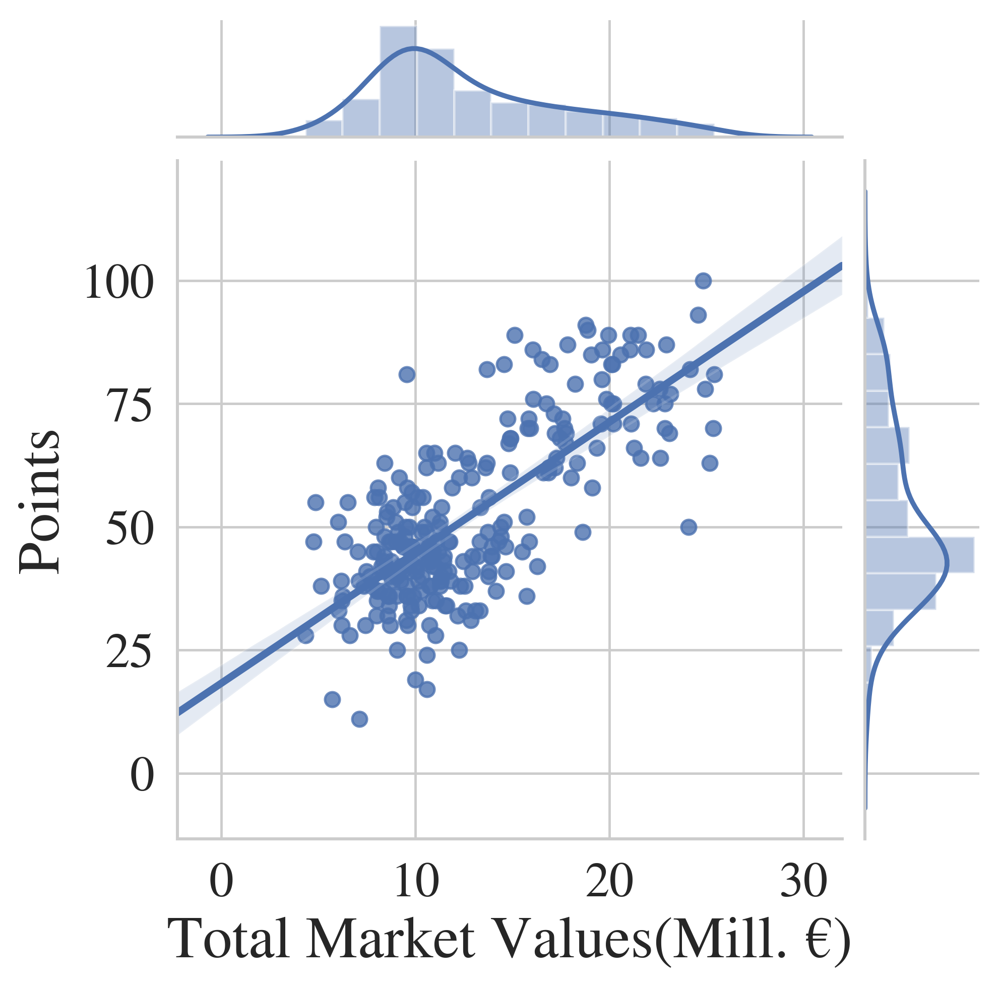

In [21]:
sns.jointplot(
    x=np.sqrt(numeric_big_summary_df[numeric_big_summary_df["Year"]!=2018].iloc[:, 4] ),
    y=numeric_big_summary_df[numeric_big_summary_df["Year"]!=2018].iloc[:, -2], kind="reg",
             )

## Training and Testing
---
Before regression, we need a mechanism to help us evaluating our prediction result. Thus, we need to split the dataset into training set and testing set.

Firstly, for convenience, the training set and test set will use abbreviated column names. However, for readability, plotting will still use the full name DataFrame 

In [96]:
training_set_df = numeric_big_summary_df.copy()

old_col_name_list = training_set_df.columns
training_set_df.rename(columns={
    old_col_name_list[0]: "avg_mv",
    old_col_name_list[1]: "avg_age",
    old_col_name_list[2]: "full",
    old_col_name_list[3]: "short",
    old_col_name_list[4]: "total_mv",
    old_col_name_list[5]: "pos",
    old_col_name_list[6]: "gd",
    old_col_name_list[7]: "pts",
    old_col_name_list[8]: "year",
}, inplace=True)

we need to split the 2018 year dataset since this is our objective in this project, to predict the standing of this year.

In [97]:
prediction_input_df = training_set_df[training_set_df["year"] == 2018]
training_set_df.drop(prediction_input_df.index, axis=0, inplace=True)

Secondly, the dataset need to be split to training set and testing set. The radio of training set is 80% and of testing set is 20%. Instead of randomly partitioning, we select one out of five in total market values ascending order. This is just for writing the report's sake, because during the developing process the performance of model is affected noticeably by the different selection of testing and training sets, also it improve the performance by having a more normally distributing data sets.

In [114]:
# testing_set_df = training_set_df.sample(frac=0.2, random_state=16446054)
# training_set_df.drop(testing_set_df.index, axis=0, inplace=True)

In [115]:
testing_set_index = np.linspace(0, len(training_set_df) - 1, num=len(training_set_df)/5, dtype=np.int)

testing_set_df = training_set_df.sort_values("total_mv").reset_index().iloc[testing_set_index, :]
training_set_df = training_set_df.reset_index().drop(testing_set_index, axis=0)

Take a look what two sets look like

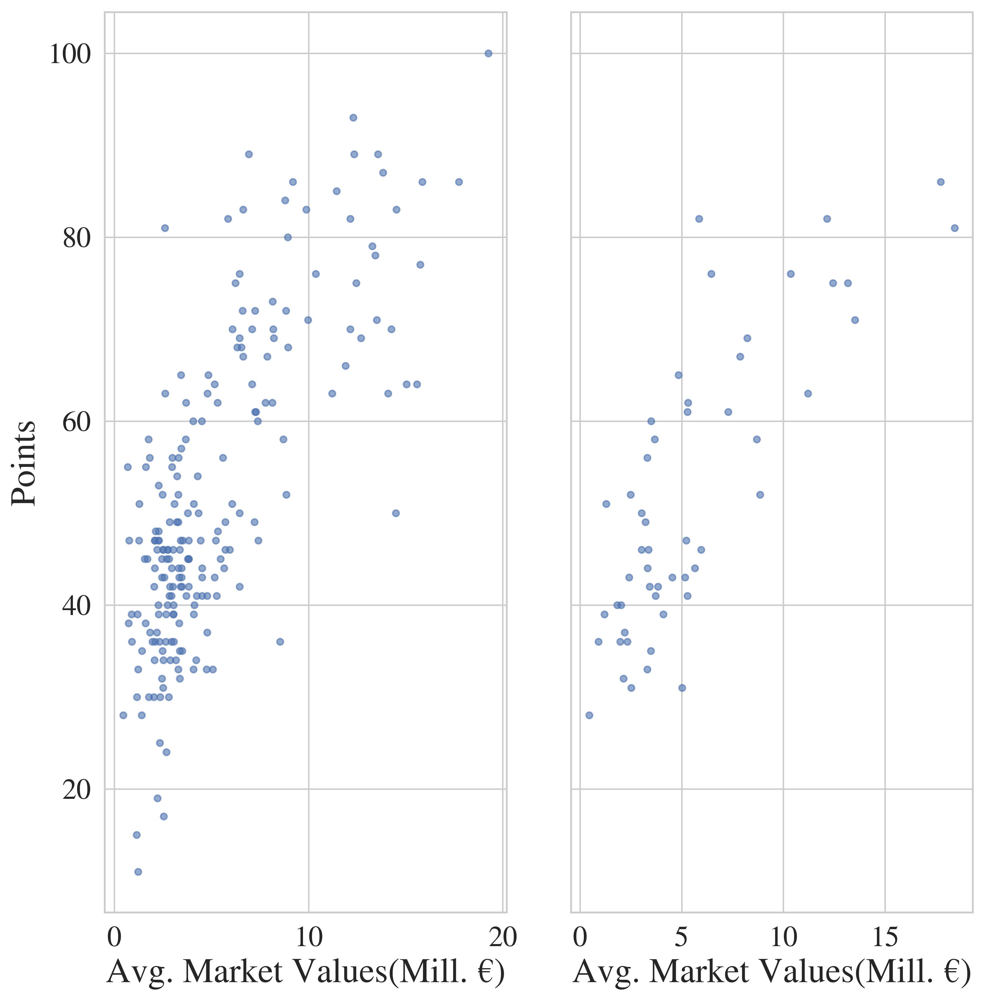

In [116]:
fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
ax1.scatter(training_set_df.avg_mv, training_set_df.pts, s=20, alpha=0.6)
ax1.set_xlabel(numeric_big_summary_df.columns[0])
ax1.set_ylabel("Points")
ax2.scatter(testing_set_df.avg_mv, testing_set_df.pts, s=20, alpha=0.6)
ax2.set_xlabel(numeric_big_summary_df.columns[0])
fig.tight_layout()

## Inputs Normalisation
---
Market value inflation rate will disturb the predictions of the models. As the big investments into the premier league, the total market values of whole league booms each year.

Text(0,0.5,'Million Euro')

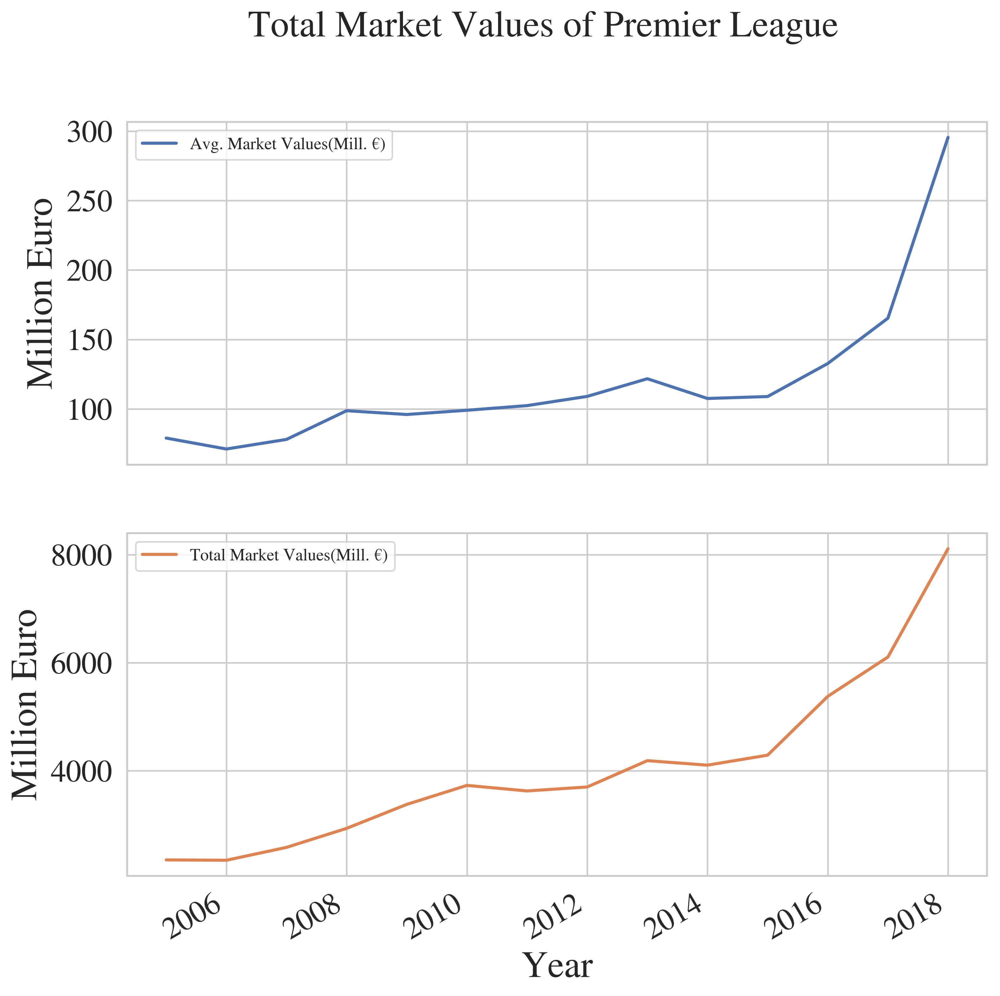

In [117]:
axes = numeric_big_summary_df.iloc[:, [0, 4, -1]].groupby("Year").sum().plot(subplots=True, title="Total Market Values of Premier League")
axes[0].set_ylabel("Million Euro")
axes[1].set_ylabel("Million Euro")

The market values of league increased steadily overall on both total and average values before 2015. Both values accelerated after 2015 and rocketed by almost 100% by now. This will confuse the models since the points and standings of league remain the same.

In [118]:
top_3_comparison_df = pd.concat((numeric_big_summary_df[numeric_big_summary_df["Year"] == 2005].head(3), numeric_big_summary_df[numeric_big_summary_df["Year"] == 2018].head(3)))

tail_3_comparison_df = pd.concat((numeric_big_summary_df[numeric_big_summary_df["Year"] == 2005].tail(3), numeric_big_summary_df[numeric_big_summary_df["Year"] == 2018].tail(3)))

combined_comparison_df = pd.concat((top_3_comparison_df, tail_3_comparison_df))

Text(0.5,1,'Top Three and Bottom Three Clubs Total Market Values in Different Years')

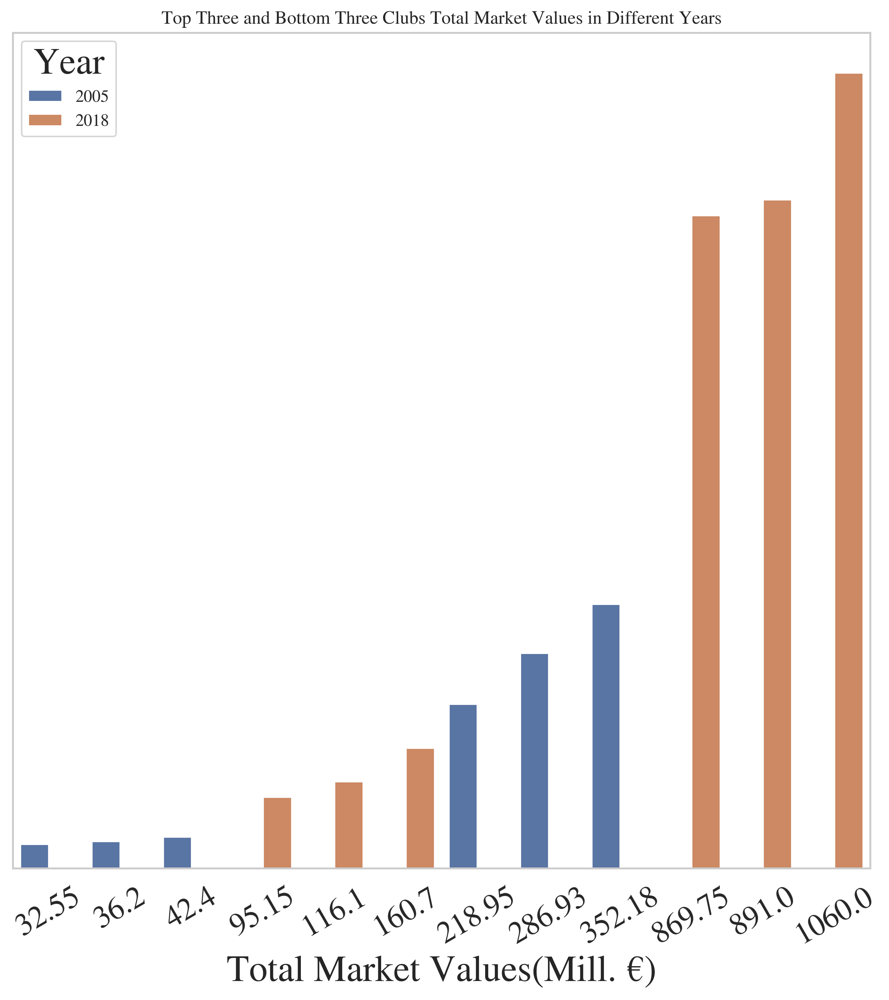

In [119]:
ax = sns.barplot(y=combined_comparison_df.iloc[:, 4], x=combined_comparison_df.iloc[:, 4], hue="Year", data=combined_comparison_df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=30)
ax.set_yticklabels([])
ax.set_ylabel("")
ax.grid(False)
ax.set_title("Top Three and Bottom Three Clubs Total Market Values in Different Years")

Above bar plot demonstrates in 2005 and 2018 the top three and bottom three total market values. It is clear to see that the total market values of the first among the bottom three clubs in 2018 is not far from the third highest valuable club in 2005. If we use a linear predictor, it will give the approximation that the 164.2 million euro club will do almost as good as the 218.95 million euro club in 2005, which dosen't make any sense. Also, the 1060 million euro worth club will not gain three times more points than the most valuable club in 2005, since the points a club can win has a limit.

### Normalisaiton Formula
To tackle the issue we describe above, a straightforward way is to normalise the inputs. 

The normalisation is included in the machine learning agent class.

## Linear Regression
---
Firstly, let's use a linear hypothesis function to describe the relationship, and evaluate the performance.

In [51]:
from ml_agent import linear_agent

### One-number Evaluation
It will be more intuitive to evaluate how good is our model by using a one-number evaluation.
To achieve this objective, we can calculate the square mean difference for the test set and prediction, the smaller the loss it is, the better the model can predict.

$$
loss = \sum_{i=1}^{n} (y_i - h(x_i))^2
$$

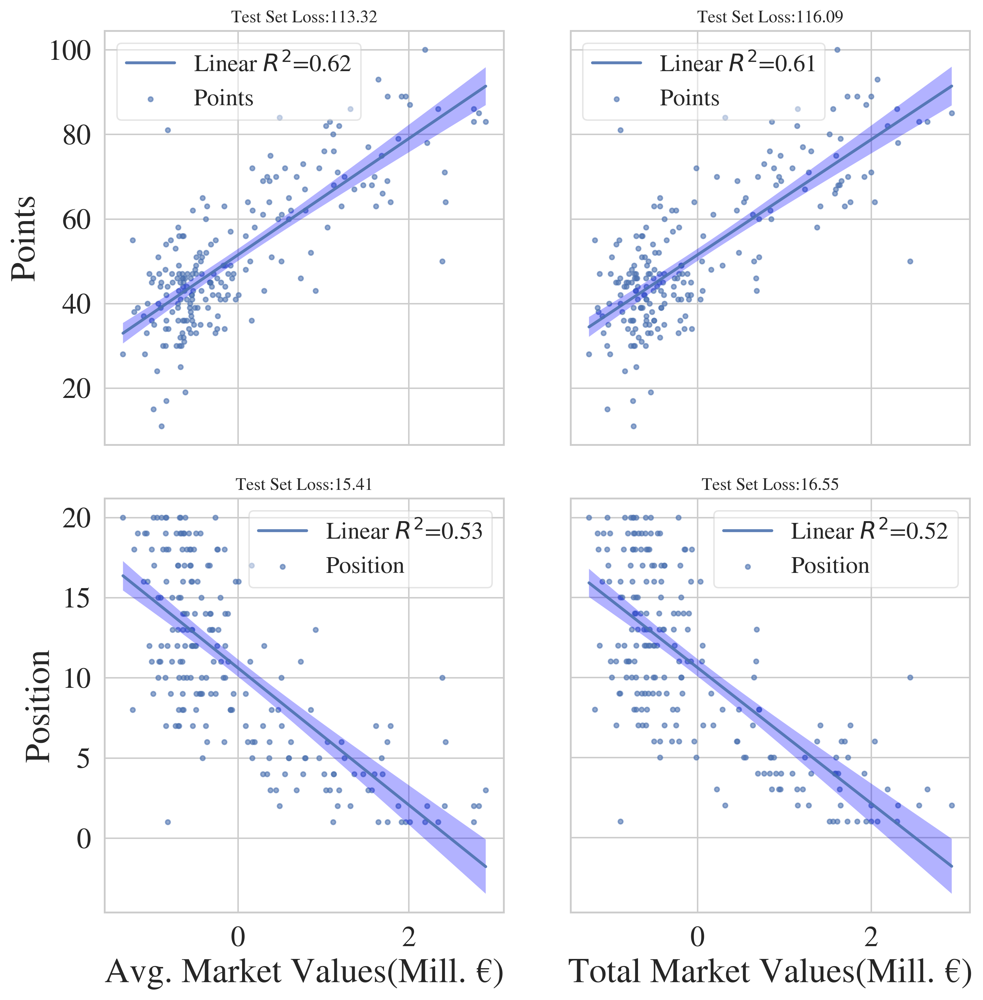

In [102]:
my_linear_agent = linear_agent(confidence=0.95)
my_linear_agent.train(train_data=training_set_df)
my_linear_agent.evaluate(train_data=training_set_df, test_data=testing_set_df, col_names=numeric_big_summary_df.columns)

Unfortunately, after normalise the inputs, the value of x axis is not that intuitive but to eliminate the effect of inflation rate of premier league, it is the trade-off we have to make. From above plots we can observe that linear model is more confident on predicting points than the position of a club. The relationship between market values and position is more complex than linear regression.

Let's try to predict the points and standings for this year with linear regression!

In [103]:
linear_prediction_df = my_linear_agent.predict(prediction_input_df)
linear_prediction_df.head(4)

Linear Model                               \
                  Avg. Market Values: Points Avg. Market Values: Position   
Manchester City                    82.244433                     1.067498   
Liverpool FC                       71.677206                     4.348080   
Chelsea FC                         68.328354                     5.387728   
Manchester United                  72.931546                     3.958672   

                                                                             
                  Total Market Values: Points Total Market Values: Position  
Manchester City                     79.830273                      1.800344  
Liverpool FC                        72.514622                      4.075773  
Chelsea FC                          71.594754                      4.361885  
Manchester United                   70.956258                      4.560480

## Non-linear Regression
---
### Polynomial n=2

In [104]:
from ml_agent import poly_2_agent

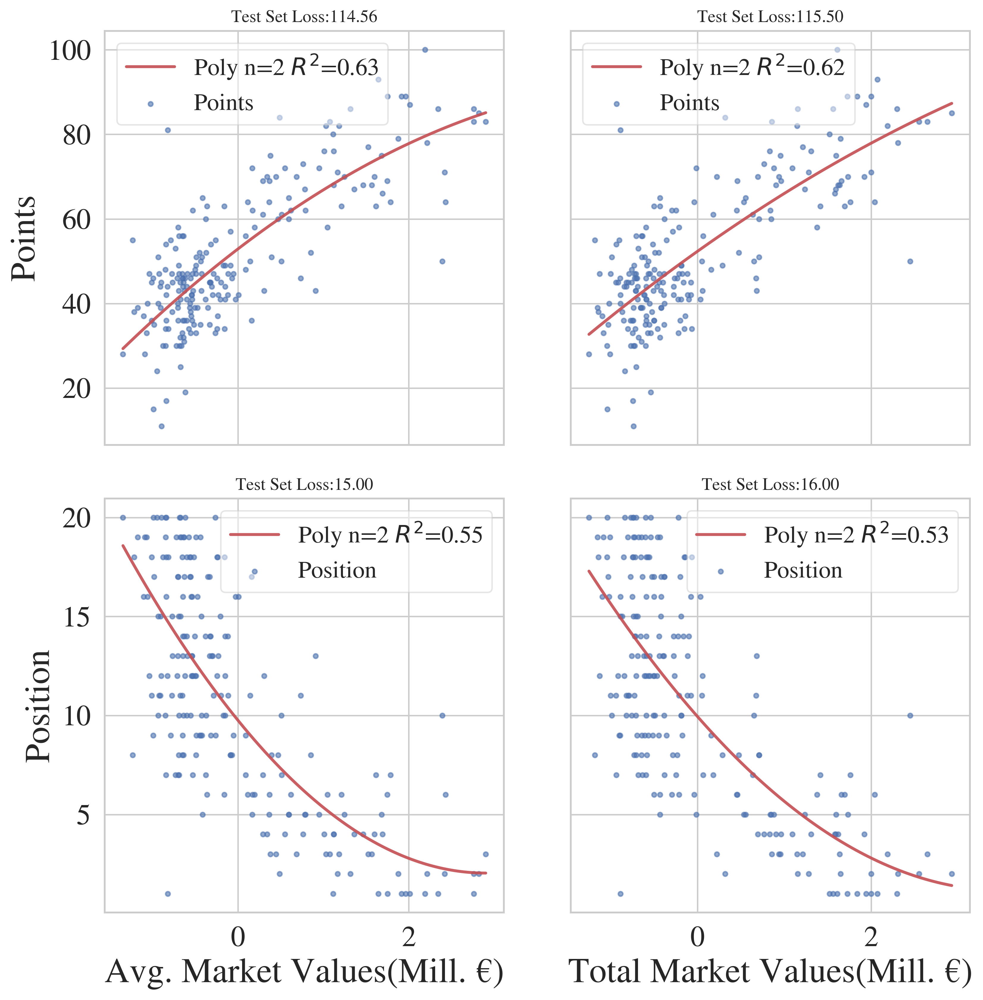

In [105]:
my_poly_2_agent = poly_2_agent()
my_poly_2_agent = poly_2_agent()
my_poly_2_agent.train(train_data=training_set_df)
my_poly_2_agent.evaluate(train_data=training_set_df, test_data=testing_set_df, col_names=numeric_big_summary_df.columns)

Interesting fact that the $R^2$ increases in polynomial regress with degree of 2, but the model performed poorer in the test set. This indicates us that the non-linear model is likely over-fitting the problem.

In [106]:
poly_prediction_df = my_poly_2_agent.predict(prediction_input_df)
poly_prediction_df.head(4)

Polynomial Degree 2                               \
                  Avg. Market Values: Points Avg. Market Values: Position   
Manchester City                    79.971243                     2.450212   
Liverpool FC                       72.367094                     3.928442   
Chelsea FC                         69.586295                     4.622559   
Manchester United                  73.362703                     3.696412   

                                                                             
                  Total Market Values: Points Total Market Values: Position  
Manchester City                     78.760688                      2.641582  
Liverpool FC                        72.684327                      3.942299  
Chelsea FC                          71.883565                      4.134733  
Manchester United                   71.322918                      4.272099

### Different Polynomial Degree

In [107]:
from ml_agent import non_linear_agent

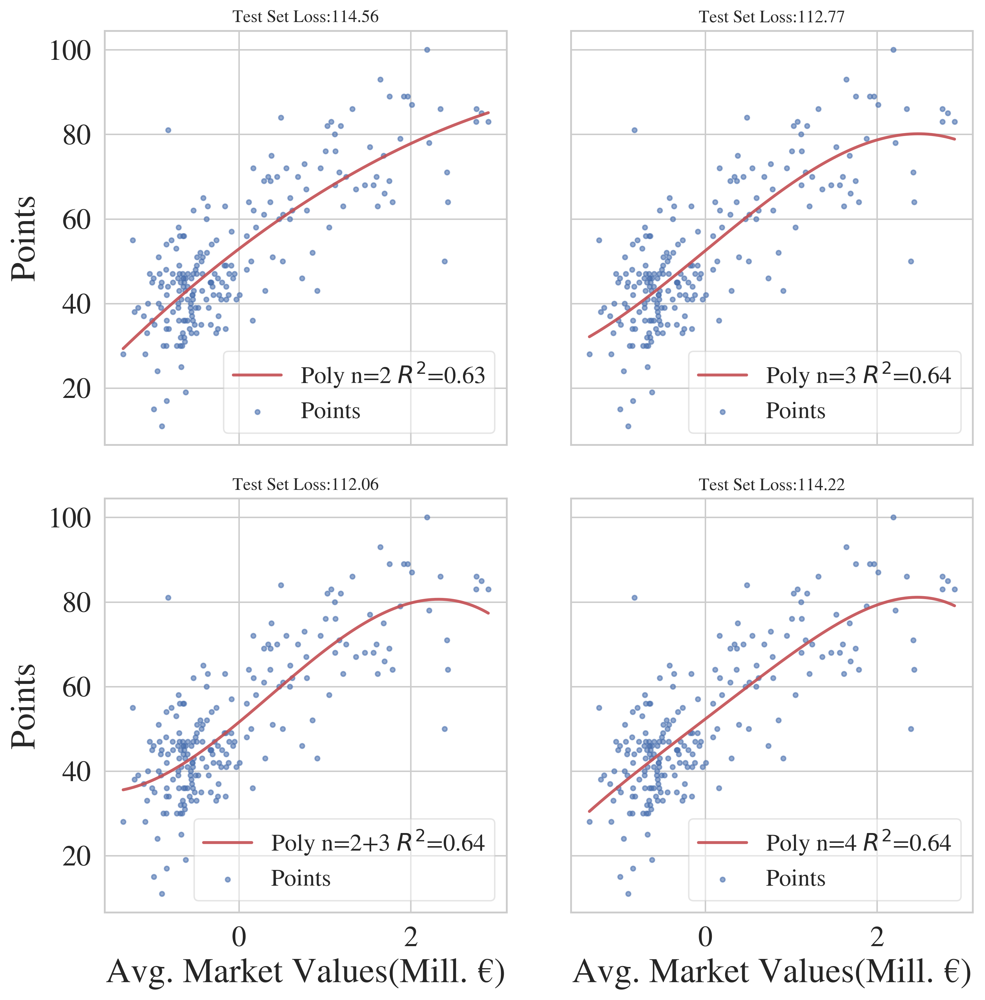

In [108]:
my_non_linear_agent = non_linear_agent()
my_non_linear_agent.train(train_data=training_set_df)
my_non_linear_agent.evaluate(train_data=training_set_df, test_data=testing_set_df,
                             col_names=numeric_big_summary_df.columns)

Judging from the loss of test set, as the degree of polynomial hypothesis function increasing, the square mean difference of test set becomes greater. At this stage, we can come to a conclusion that non-linear regression will have a high variance over this problem.

In [109]:
non_linear_prediction = my_non_linear_agent.predict(prediction_input_df)
non_linear_prediction.head(4)

Non-linear Model                        \
                  Polynomial Degree 2 Polynomial Degree 2+3   
Manchester City             79.971243             80.569448   
Liverpool FC                72.367094             75.066808   
Chelsea FC                  69.586295             71.889839   
Manchester United           73.362703             76.110561   

                                                           
                  Polynomial Degree 3 Polynomial Degree 4  
Manchester City             79.748818           80.630886  
Liverpool FC                74.158188           73.938972  
Chelsea FC                  71.285404           70.767412  
Manchester United           75.116550           75.031456

The prediction is not convincing enough for the real situation even for the polynomial with degree of 2. A negative points demonstrates the model suffers the over-fitting problem just like we inferred on plots observation. 

## K Nearest Neighbours
---


In [110]:
from ml_agent import knn_agent
my_knn_agent = knn_agent()

### Validation
Due to the KNN algorithm has some hypo-parameters, it is crucial to find the optimum value for those hypo-parameters before the training and testing stage. In our case, we explore the different values for the number of neighbours and the weights selection between _uniform_ and _distance_.

Even it is recommended that use a separated cross-validating set to validate your model, but we just use the testing set because the number of samples is not sufficient enough(data set starts from 2005, the market values prior to 2005 is not available on the website).

/usr/local/lib/python2.7/site-packages/pandas/plotting/_core.py:194: UserWarning: 'colors' is being deprecated. Please use 'color'instead of 'colors'
  warnings.warn(("'colors' is being deprecated. Please use 'color'"


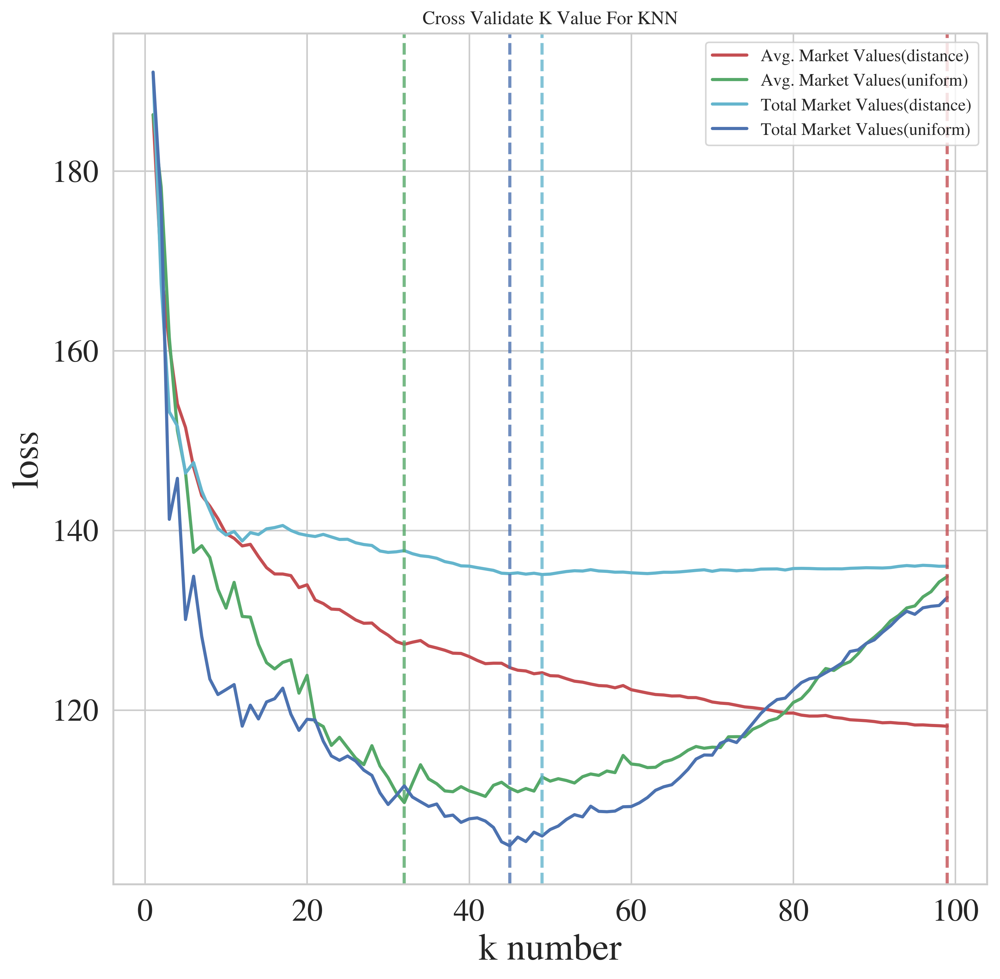

In [111]:
my_knn_agent.validate(train_data=training_set_df, test_data=testing_set_df, max_k_num=100)

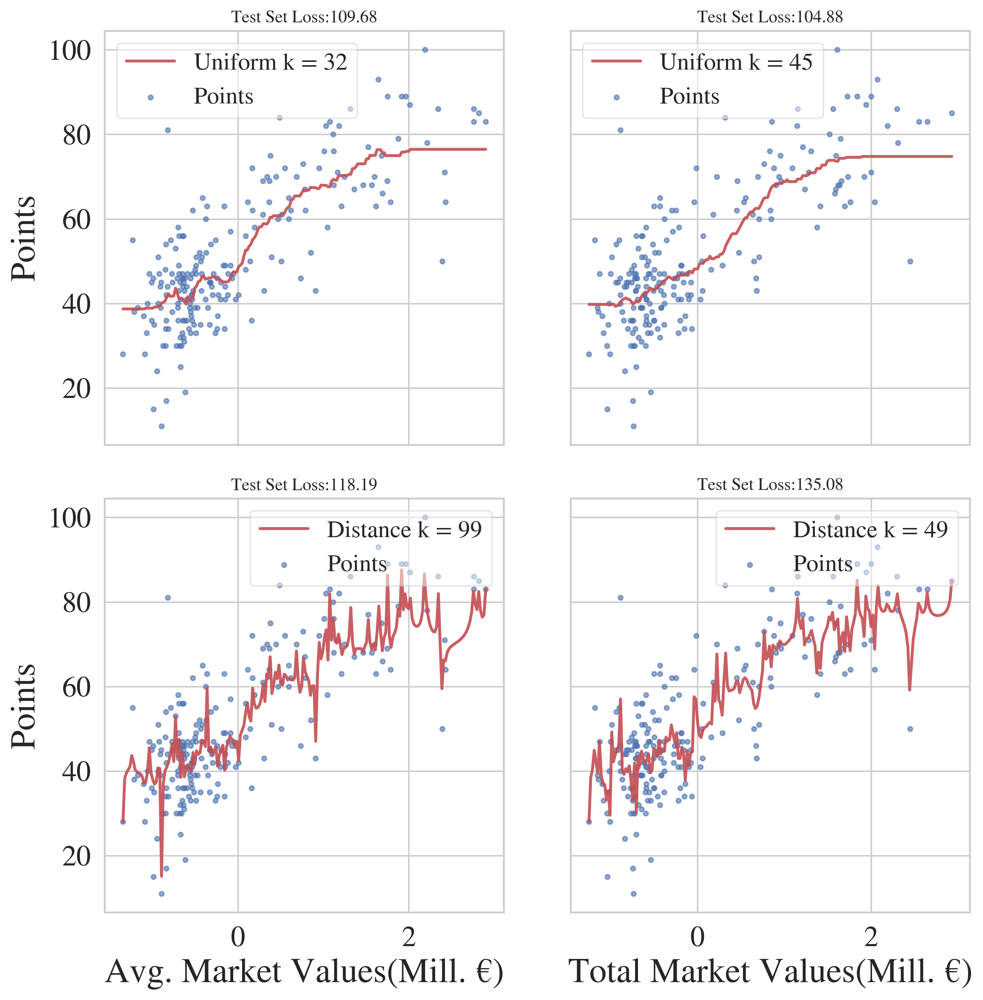

In [112]:
my_knn_agent.train(train_data=training_set_df)
my_knn_agent.evaluate(train_data=training_set_df, test_data=testing_set_df, col_names=numeric_big_summary_df.columns)

In [113]:
my_knn_agent.predict(x=prediction_input_df).head(4)

K Nearest Neighbour(Distance Weights)  \
                             Avg. Market Values: Points   
Manchester City                               75.640112   
Liverpool FC                                  68.418329   
Chelsea FC                                    68.230641   
Manchester United                             69.602921   

                                               \
                  Total Market Values: Points   
Manchester City                     86.387393   
Liverpool FC                        75.708183   
Chelsea FC                          73.050682   
Manchester United                   69.013697   

                  K Nearest Neighbour(Uniform Weights)  \
                            Avg. Market Values: Points   
Manchester City                               76.46875   
Liverpool FC                                  73.03125   
Chelsea FC                                    70.28125   
Manchester United                             75.03125   

                                               
                  Total Market Values: Points  
Manchester City                     74.777778  
Liverpool FC                        73.866667  
Chelsea FC                          72.733333  
Manchester United                   71.933333